In [90]:
import numpy as np
import pandas as pd
import vectorbt as vbt
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas_ta as ta
import yfinance as yf 
import warnings
import plotly.graph_objects as go
from plotly.subplots import make_subplots
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
%matplotlib inline

##### Full Data

In [93]:
# EURUSD Full
df = pd.read_csv('2022.2.9EURUSD-H4-NoSession.csv')
df.Date = df.Date.astype(str)+' '+ df.Time
df.Date = pd.to_datetime(df.Date)
df.drop(columns= ['Time'], inplace = True)
df = df.set_index('Date')

##### Trend, Non-Trend Data

In [94]:
dftr1 = pd.read_csv('TRE_EURUSD_2011_2015.csv', index_col = 'Date')
dftr2 = pd.read_csv('TRE_EURUSD_2017_2018.csv', index_col = 'Date')
# ------------------------------------------------------------------
dfsw1 = pd.read_csv('SW_EURUSD_2015_2017_4H.csv', index_col = 'Date')
dfsw2 = pd.read_csv('SW_EURUSD_2010_2014_4H.csv', index_col = 'Date')

##### Util Function

In [105]:
#initial
def set_up_df(df:pd.DataFrame , index):  
    df1    =   pd.DataFrame(columns=index)
    df1['date']  =    df.index 
    df1.date = pd.to_datetime(df1.date,format='%Y-%m-%d')
    df1 = df1.set_index('date')
    return df1

#for calculate duration
def convert_to_hours(delta):
    total_seconds = delta.total_seconds()
    hours = str(int(total_seconds // 3600))
    return hours

#Performance Matric
def cal_consecutive(df:pd.DataFrame):
    df['win']= np.sign(df) # assign sign on log
    blocks = df['win'].ne(df['win'].shift()).cumsum() 
    df['consecutive_WL'] = df['win'].groupby(blocks).cumsum()
    return df['consecutive_WL'] 

def Cal_portstat(port):
    port_return = port.total_return().to_frame()
    port_return['MaxDD'] = port.max_drawdown()
    port_return['NumTrade'] = port.trades.count()
    port_return['WinRate'] = port.trades.win_rate()
    port_return['AvgWinningTrade'] = port.trades.winning.returns.mean()
    port_return['AvgLosingTrade'] = port.trades.losing.returns.mean()
    port_return['SharpRatio'] = port.returns_acc.sharpe_ratio()
    return port_return

def Cal_pip(df):
    pip = []
    pipp = df['Avg Exit Price'] - df['Avg Entry Price']
    for i in portfinal['Direction']:
        if i == 'Long':
            pip.append(1)
        else :
            pip.append(-1)    
    return (pip * pipp) 

def Cal_mae_mfe(data,port):
    MAE = []
    MFE = []
    for i,j,y,k in zip(port['Entry Timestamp'], port['Exit Timestamp'], port['Avg Entry Price'], port['Direction']):
        if k == 'Long':
            MFE.append((data.loc[i:j]['High'].max() - y)/y)
            MAE.append((y - df.loc[i:j]['Low'].min())/y)
        else :
            MAE.append((data.loc[i:j]['High'].max() - y)/y)
            MFE.append((y - df.loc[i:j]['Low'].min())/y)
    return MAE, MFE  

def Calkelly(port):
    init_cash = 10000
    W = port.stats()[15]/100
    A = abs(port.stats()[19])
    B = port.stats()[18]
    Percent_kelly = (W/A) - ((1-W)/B)
    riskpertrade = Percent_kelly * init_cash
    return Percent_kelly

# def Cal_EWMvolatile(df, period = 100):
#     df['logreturns'] = np.log(df.Close/df.Close.shift(1))
#     df['vol'] = df['logreturns'].rolling(period).std()*252**.5
#     df['ewmvol'] = df['vol'].ewm(alpha=0.96).mean()
#     return df['ewmvol']    

### Cal Strategy Kelly

In [96]:
def strategy(df):
    e1 = df.ta.ema(12)
    e2 = df.ta.ema(26)
    ckpl = df.ta.cksp()['CKSPl_10_3_20']
    ckps = df.ta.cksp()['CKSPs_10_3_20']
    
    l1 = (e1 > e2) & (e1.shift(1) < e2) 
    l2 = (df.Close > e1)
    long_signal = l1 & l2

    s1 = (e1 < e2) & (e1.shift(1) > e2)
    s2 = (df.Close < e1)
    short_signal = s1 & s2 

    long_exit =  (df.Close < ckpl)
    short_exit =  (df.Close > ckpl)
    return long_signal, long_exit, short_signal, short_exit

In [108]:
def Calkelly_strategy(df, timeframe = '1h', cash = 10000):
    
    long_signal, long_exit, short_signal, short_exit = strategy(df)

    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = long_signal,
                                    exits = long_exit,
                                    short_entries = short_signal,
                                    short_exits = short_exit,
                                    freq = timeframe,
                                    init_cash = cash,
                                    fees = 0.00,
                                    slippage = 0.00)
    return Calkelly(port)

kelly_percent = Calkelly_strategy(df)
print(kelly_percent)

0.05161075391717351


### Strategy with Kelly Criterion + Dynamic Stoploss

In [109]:
def improve_strategy(df, timeframe = '1h', cash = 10000, percentkel = kelly_percent): 
    long_signal, long_exit, short_signal, short_exit = strategy(df) # Add strategy signal
    
    df['vol'] = df.ta.stdev().ewm(alpha=0.96).mean() # Calculate volatility 
    df['sl_stop'] = (df['vol'] * 2) / df.Close       # Calculate stoploss by volatility*multiply 
    df['size'] = ((percentkel * cash)/df['sl_stop'])/ df.Close  # Calculate size by percentkelly riskpertrade
    
    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = long_signal,
                                    exits = long_exit,
                                    short_entries = short_signal,
                                    short_exits = short_exit,
                                    freq = timeframe,
                                    init_cash = cash, size = df['size'],
                                    fees = 0.00, sl_stop = df['sl_stop'],
                                    slippage = 0.00)
    return port

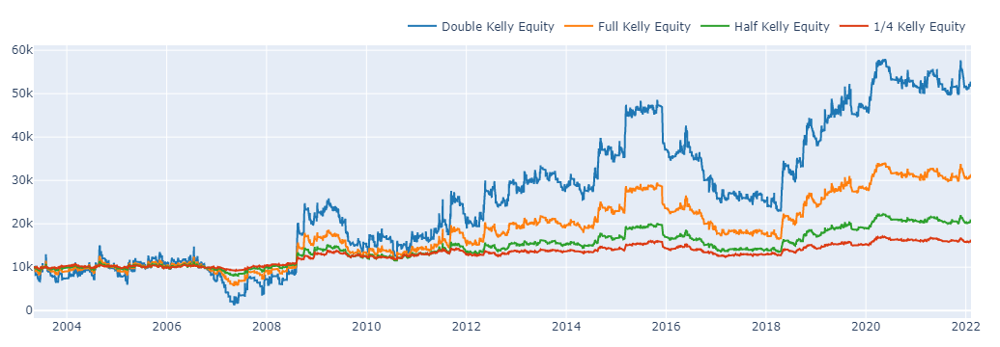

In [110]:
aa = improve_strategy(df, percentkel = kelly_percent * 2)
a = improve_strategy(df, percentkel = kelly_percent * 1)
b = improve_strategy(df, percentkel = kelly_percent * 0.5)
c = improve_strategy(df, percentkel = kelly_percent * 0.25)

fig = aa.value().vbt.plot(trace_kwargs=dict(name='Double Kelly Equity'))
a.value().vbt.plot(trace_kwargs=dict(name='Full Kelly Equity'), fig=fig)
b.value().vbt.plot(trace_kwargs=dict(name='Half Kelly Equity'), fig=fig)
c.value().vbt.plot(trace_kwargs=dict(name='1/4 Kelly Equity'), fig=fig)
fig.show()

In [111]:
kellstat = pd.DataFrame([aa.stats(), a.stats(), b.stats(), c.stats()]).T
kellstat.columns = ['Double Kelly Equity', 'Full Kelly Equity', 'Half Kelly Equity' ,'1/4 Kelly Equity']
kellstat

,Double Kelly Equity,Full Kelly Equity,Half Kelly Equity,1/4 Kelly Equity
Start,2003-05-05 00:00:00,2003-05-05 00:00:00,2003-05-05 00:00:00,2003-05-05 00:00:00
End,2022-02-07 20:00:00,2022-02-07 20:00:00,2022-02-07 20:00:00,2022-02-07 20:00:00
Period,1262 days 00:00:00,1262 days 00:00:00,1262 days 00:00:00,1262 days 00:00:00
Start Value,10000.0,10000.0,10000.0,10000.0
End Value,52541.769168,31213.199728,20690.925961,16061.932028
Total Return [%],425.417692,212.131997,106.90926,60.61932
Benchmark Return [%],2.004244,2.004244,2.004244,2.004244
Max Gross Exposure [%],100.0,113.349604,622.248745,1125.246158
Total Fees Paid,0.0,0.0,0.0,0.0
Max Drawdown [%],90.623132,53.650501,32.903945,23.275837
